In [270]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import folium
from folium.plugins import MarkerCluster

In [271]:
df = pd.read_csv('../data/zomato.csv', encoding='latin -1')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Basic Information

In [272]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [273]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [274]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


Handling the missing values

In [275]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [276]:
df.dropna(inplace=True)
df.isna().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

Action Taken: Droped 9 records with missing value

Data Cleaning
1. Droping rows where latitude or longitude is zero
2. Droping rows with Aggregate rating is 0
3. Droping rows with less the 10 Votes

In [277]:
df=df[~((df['Latitude']==0)&(df['Longitude']==0))]
df = df[df['Aggregate rating'] != 0.0] 
df = df[df['Votes']>10]

Mearging the Country dataset

In [278]:
df_country = pd.read_excel('../data/Country-Code.xlsx')
df_country.head()

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia


In [279]:
df = pd.merge(df, df_country, on = 'Country Code', how='left')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


In [280]:
df.Country.value_counts().index

Index(['India', 'United States', 'United Kingdom', 'UAE', 'South Africa',
       'New Zealand', 'Brazil', 'Turkey', 'Australia', 'Phillipines',
       'Singapore', 'Qatar', 'Indonesia', 'Sri Lanka', 'Canada'],
      dtype='object', name='Country')

Descriptive Analysis

In [281]:
num_df = df.select_dtypes(include=['int64', 'float64'])
num_df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,6.169000e+03,6169.000000,6169.000000,6169.000000,6169.000000,6169.000000,6169.000000,6169.000000
mean,6.598761e+06,27.159345,64.146802,26.826105,1633.701086,2.065002,3.513908,238.960447
std,8.261264e+06,68.106070,46.207229,10.969080,20005.207808,0.935235,0.557743,516.589006
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,1.800000,11.000000
25%,8.883000e+03,1.000000,77.087523,28.478858,300.000000,1.000000,3.200000,31.000000
50%,3.104470e+05,1.000000,77.194129,28.570142,500.000000,2.000000,3.500000,84.000000
75%,1.803783e+07,1.000000,77.268801,28.647391,800.000000,3.000000,3.900000,223.000000
max,1.849606e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


The distribution of categorical variables 

Distribution of Countries (Top 5 by Number of Restaurants)

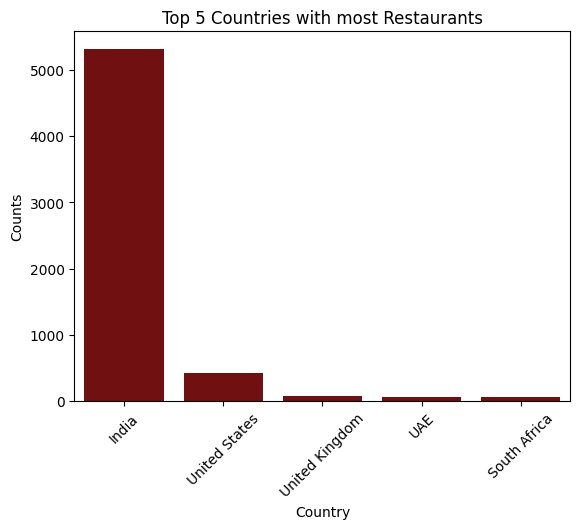

In [282]:
sns.barplot(x=df['Country'].value_counts().index[:5], y=df['Country'].value_counts().values[:5], color='maroon')
plt.xticks(rotation = 45)
plt.title('Top 5 Countries with most Restaurants')
plt.xlabel('Country')
plt.ylabel('Counts')
plt.show()

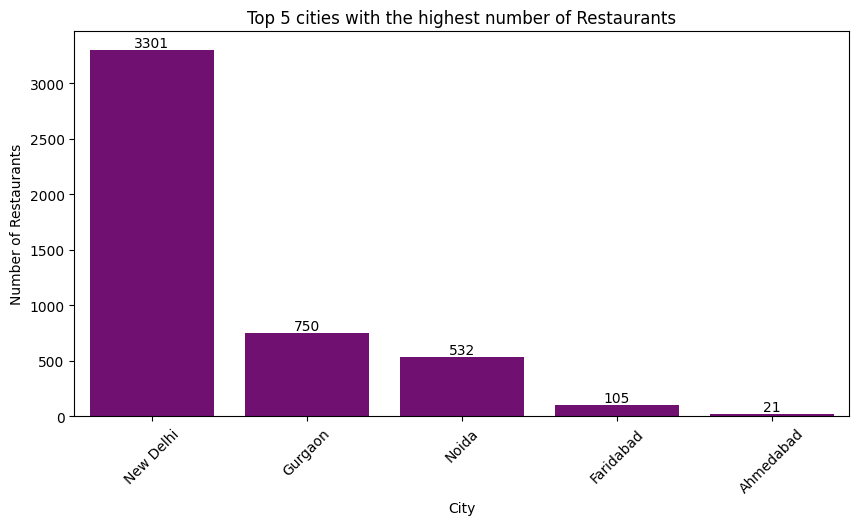

In [283]:
fig, ax= plt.subplots(figsize=(10,5))
bar = sns.barplot(x = df['City'].value_counts().index[:5], y = df['City'].value_counts().values[:5], color = 'purple')
ax.bar_label(bar.containers[0])
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.title('Top 5 cities with the highest number of Restaurants')
plt.xticks(rotation = 45)
plt.show()

The top 5 cuisines

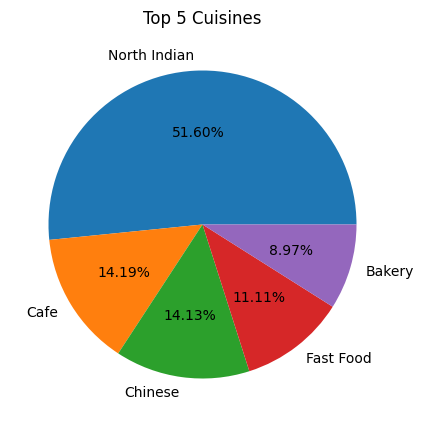

In [284]:
df['Primary_Cuisine'] = df['Cuisines'].apply(lambda x: str(x).split(',')[0]) #creating new column with the Primary (First Listed) Cuisine of restuarant Cuisine of restuarant
plt.figure(figsize=(10, 5))
plt.pie(x=df['Primary_Cuisine'].value_counts()[:5], labels=df['Primary_Cuisine'].value_counts().index[:5], autopct = '%.2f%%')
plt.title('Top 5 Cuisines')
plt.show()

Plotting Longitude and Latitude on Map

In [285]:
map = folium.Map(location= [df['Latitude'].mean(),df['Longitude'].mean()], zoom_start = 5)
cluster = MarkerCluster().add_to(map)
for idx, i in df.iterrows():
    folium.Marker(
        location = [i['Latitude'], i['Longitude']],
        popup = f"<b>{i['Restaurant Name']}</b>,\n{i['Locality']},\n{i['City']}",
        icon = folium.Icon(icon='cutlery', color='red', prefix='fa')
    ).add_to(cluster)
map

Country-Level Analysis

Country-Level Analysis
Correlation Between Restaurant Count and Average Rating by Country

In [286]:
country_rating=df.groupby('Country').agg({'Aggregate rating':'mean', 'Restaurant ID':'count'}).sort_values(by='Aggregate rating', ascending=False)
print('The Corelation between Country and Number of Restaurents is:', country_rating['Aggregate rating'].corr(country_rating['Restaurant ID']))

The Corelation between Country and Number of Restaurents is: -0.5396346201375747


A correlation of -0.63 suggests a moderate to strong negative relationship between the number of restaurants in a country and its average rating.

Country-Level Visualizations

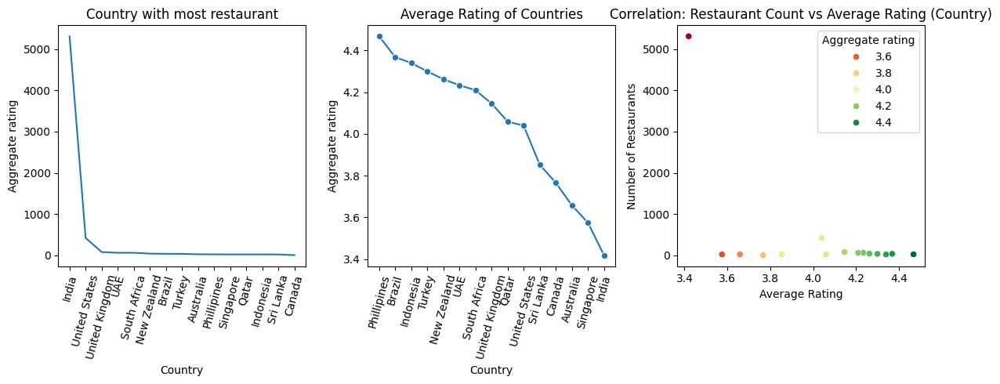

In [287]:
fig = plt.subplots(1, 3, figsize = (12,5))
plt.subplot(131)
sns.lineplot(x=df['Country'].value_counts().index, y=df['Country'].value_counts().values)
plt.title('Country with most restaurant')
plt.xticks(rotation=75)
plt.xlabel('Country')
plt.ylabel('Aggregate rating')

plt.subplot(132)
sns.lineplot(x=country_rating.index, y=country_rating['Aggregate rating'],marker='o')
plt.xticks(rotation=75)
plt.title('Average Rating of Countries')
plt.xlabel('Country')
plt.ylabel('Aggregate rating')

plt.subplot(133)
sns.scatterplot(x=country_rating['Aggregate rating'], y=country_rating['Restaurant ID'], hue=country_rating['Aggregate rating'], palette="RdYlGn")
plt.title('Correlation: Restaurant Count vs Average Rating (Country)')
plt.xlabel('Average Rating')
plt.ylabel('Number of Restaurants')
plt.tight_layout()
plt.show()

Insights:
1. Higher restaurant density = lower ratings
    - Countries with many restaurants might have greater competition, leading to a mix of high and low ratings.

2. Smaller restaurant markets = higher ratings
    - Countries with fewer restaurants are well reviewed boosting their average rating.

City-Level Analysis

City Ratings & Correlation

In [288]:
city_rating=df.groupby('City').agg({'Aggregate rating':'mean', 'Restaurant ID':'count'}).sort_values(by='Aggregate rating',ascending=False)

print('The Correlation of Rating and the Number of Restaurents in City: ', city_rating['Aggregate rating'].corr(city_rating['Restaurant ID']))

The Correlation of Rating and the Number of Restaurents in City:  -0.1559416073298969


A correlation of -0.18 suggests a weak negative relationship between the number of restaurants in a city and their average rating. This means that as the number of restaurants increases, the ratings tend to decrease slightly, but not in a strongly predictable way.

City-Level Visualizations

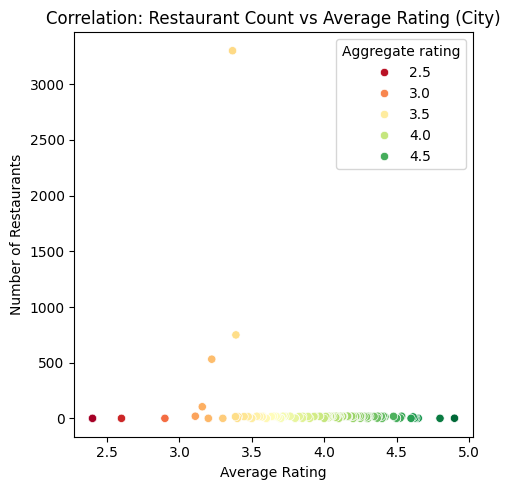

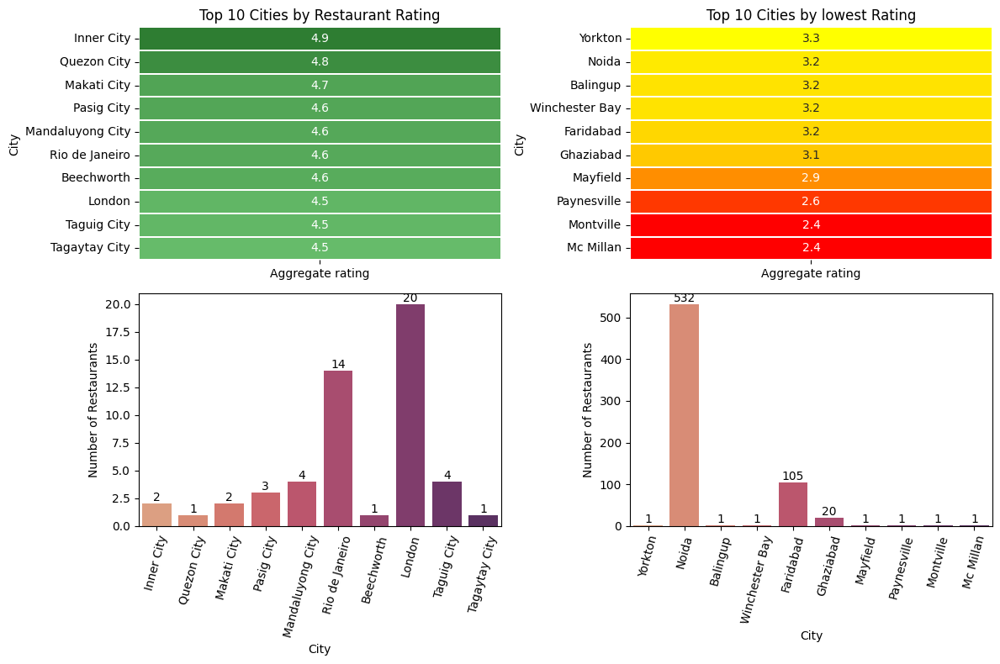

In [289]:
plt.figure(figsize=(5,5))
sns.scatterplot(x=city_rating['Aggregate rating'], y=city_rating['Restaurant ID'], hue=city_rating['Aggregate rating'], palette='RdYlGn')
plt.title('Correlation: Restaurant Count vs Average Rating (City)')
plt.xlabel('Average Rating')
plt.ylabel('Number of Restaurants')
plt.tight_layout()
plt.show()

fig = plt.subplots(2,2, figsize=(12,8))
plt.subplot(221)
green_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom_green", ["#66bb6a","#2e7d32"])
sns.heatmap(city_rating[['Aggregate rating']][:10], annot=True, cmap=green_cmap, linewidths=0.1, cbar=False)
plt.title('Top 10 Cities by Restaurant Rating')

plt.subplot(222)
sns.heatmap(city_rating[['Aggregate rating']][-10:], annot=True, cmap='autumn',cbar=False, linewidths=0.1)
plt.title('Top 10 Cities by lowest Rating')

ax=plt.subplot(223)
bar=sns.barplot(x=city_rating.index[:10], y=city_rating['Restaurant ID'][:10], palette='flare')
plt.ylabel('Number of Restaurants')
for i in bar.containers:
    ax.bar_label(i)

plt.xticks(rotation=75)

ax=plt.subplot(224)
bar=sns.barplot(x=city_rating.index[-10:], y=city_rating['Restaurant ID'][-10:], palette='flare')

for i in bar.containers:
    ax.bar_label(i)
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=75)
plt.tight_layout()
plt.show()

Insights:
1. The negative correlation is small, meaning that while cities with more restaurants might slightly see lower ratings, it's not a strong trend.
2. In cities with many restaurants, there could be a wider mix of quality, leading to lower averages.

Locality-Level Analysis: New Delhi

Local Rating and Votes

In [290]:
delhi = df[df['City']=='New Delhi']
delhi_rating = delhi.groupby('Locality').agg({'Aggregate rating':'mean', 'Restaurant ID':'count'}).sort_values(by='Aggregate rating', ascending=False)
print('The Corelation between City and Number of Restaurents is: ',delhi_rating['Aggregate rating'].corr(delhi_rating['Restaurant ID']))

The Corelation between City and Number of Restaurents is:  -0.03287539728390178


The number of restaurants in a locality in New Delhi has little to no effect on their average ratings

Locality-Level Visualizations

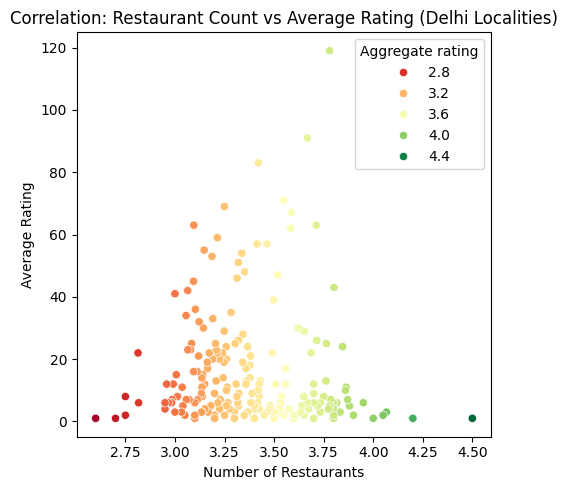

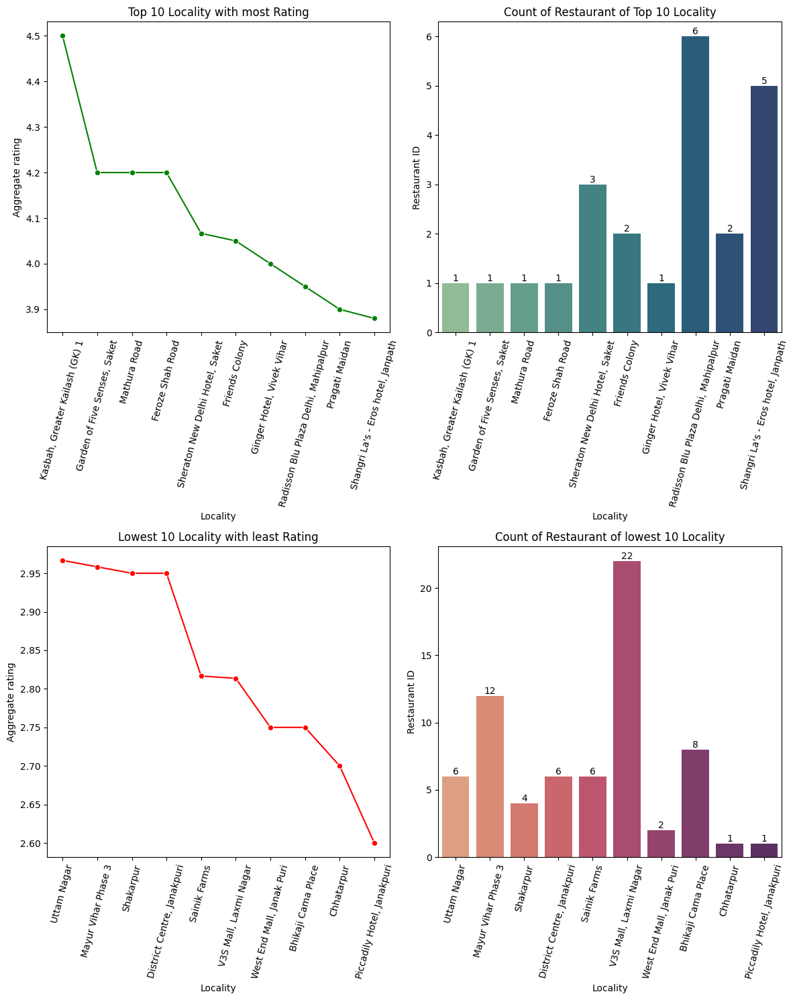

In [291]:
plt.figure(figsize=(5,5))
sns.scatterplot(data=delhi_rating, x='Aggregate rating', y='Restaurant ID', hue='Aggregate rating', palette='RdYlGn')
plt.title('Correlation: Restaurant Count vs Average Rating (Delhi Localities)')
plt.xlabel('Number of Restaurants')
plt.ylabel('Average Rating')
plt.tight_layout()
plt.show()

fig = plt.subplots(2,2,figsize=(12,15))
plt.subplot(221)
sns.lineplot(x=delhi_rating.index[:10], y=delhi_rating['Aggregate rating'][:10], color='green', marker='o')
plt.xticks(rotation=75)
plt.title('Top 10 Locality with most Rating')

ax = plt.subplot(222)
bar = sns.barplot(x=delhi_rating.index[:10], y=delhi_rating['Restaurant ID'][:10], palette='crest')

for i in bar.containers:
    ax.bar_label(i)

plt.xticks(rotation=75)
plt.title('Count of Restaurant of Top 10 Locality')

plt.subplot(223)
sns.lineplot(x=delhi_rating.index[-10:], y=delhi_rating['Aggregate rating'][-10:], color='red', marker='o')
plt.xticks(rotation=75)
plt.title('Lowest 10 Locality with least Rating')

ax = plt.subplot(224)
bar = sns.barplot(x=delhi_rating.index[-10:], y=delhi_rating['Restaurant ID'][-10:],palette='flare')

for i in bar.containers:
    ax.bar_label(i)

plt.xticks(rotation=75)
plt.title('Count of Restaurant of lowest 10 Locality')

plt.tight_layout()
plt.show()

Percentage of restaurants offering table booking and online delivery

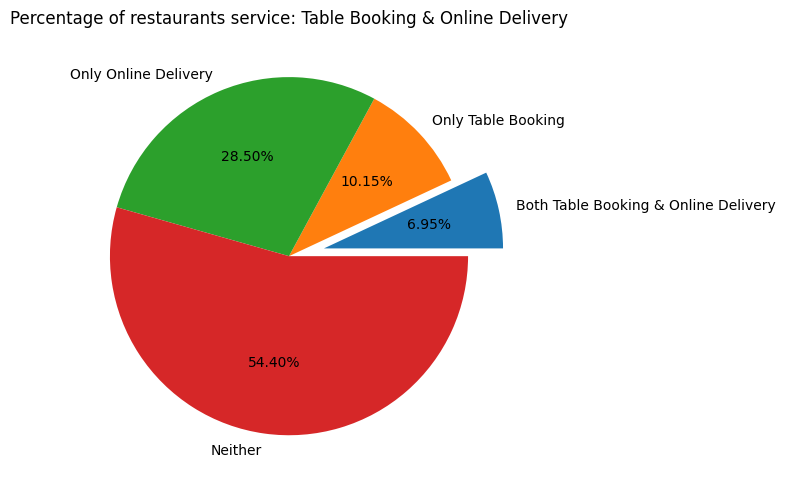

In [292]:
both = len(df[(df['Has Table booking'] == 'Yes') & (df['Has Online delivery'] == 'Yes')])
only_table = len(df[(df['Has Table booking'] == 'Yes') & (df['Has Online delivery'] == 'No')])
only_online = len(df[(df['Has Table booking'] == 'No') & (df['Has Online delivery'] == 'Yes')])
neither = len(df[(df['Has Table booking'] == 'No') & (df['Has Online delivery'] == 'No')])

labels = ['Both Table Booking & Online Delivery', 'Only Table Booking', 'Only Online Delivery', 'Neither']
sizes = [both, only_table, only_online, neither]

plt.figure(figsize=(8,5))
plt.pie(sizes, labels=labels, autopct='%.2f%%', explode=[.2,0,0,0])
plt.title('Percentage of restaurants service: Table Booking & Online Delivery')
plt.tight_layout()
plt.show()

Insight:
- Rastaurants offering Both Table Booking and Online Delivery are only 6.95% 
- The high number of rastaurant do not offer both the services 

Compare average ratings: with vs without Table Booking

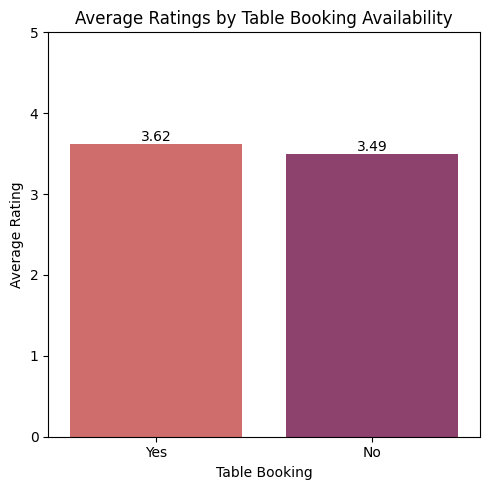

In [293]:
plt.figure(figsize=(5,5))
ratingbytable= df.groupby('Has Table booking')['Aggregate rating'].mean().sort_values(ascending=False)
bar = sns.barplot(x=ratingbytable.index, y=ratingbytable, palette='flare')
plt.title('Average Ratings by Table Booking Availability')
plt.ylabel('Average Rating')
plt.xlabel('Table Booking')
plt.ylim(0, 5)
for i in bar.containers:
    bar.bar_label(i,fmt='%.2f')
plt.tight_layout()
plt.show()

Insight:
- Restaurant with and without table booking. Restaurants without table booking have sightly higher average ratings.

Analyze online delivery across price ranges

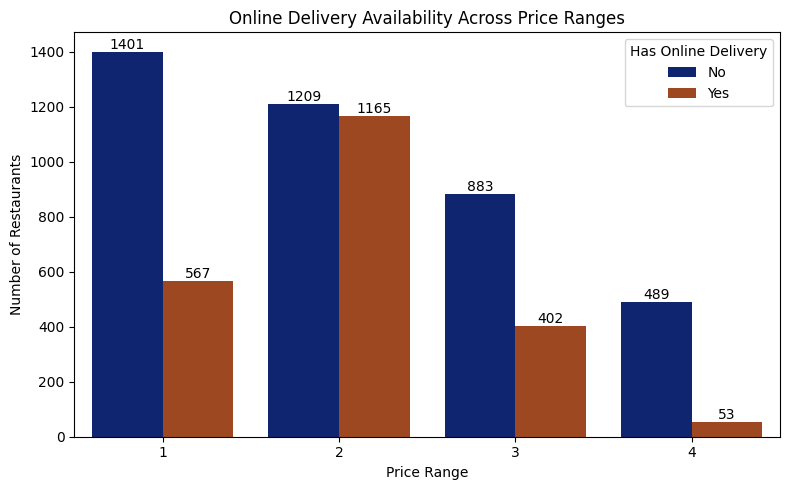

In [294]:
plt.figure(figsize=(8,5))
bar = sns.countplot(data=df, x='Price range', hue='Has Online delivery', palette='dark')
plt.title('Online Delivery Availability Across Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.legend(title='Has Online Delivery')
for i in bar.containers:
    bar.bar_label(i)

plt.tight_layout()
plt.show()

The most common price range

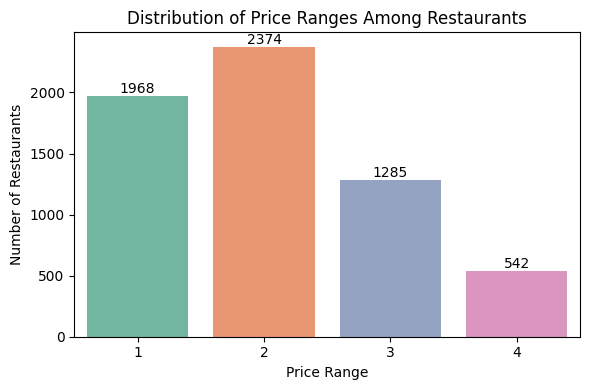

In [295]:
common_price_range = df['Price range'].value_counts().idxmax()
ax = plt.figure(figsize=(6,4))
bar = sns.countplot(data=df, x='Price range', palette='Set2')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
for i in bar.containers:
    bar.bar_label(i)
plt.tight_layout()
plt.show()

Insight:
- Price range 2 is the most prevalent followed by Price Range 3, indicating that the market tends to favor mid-range options.

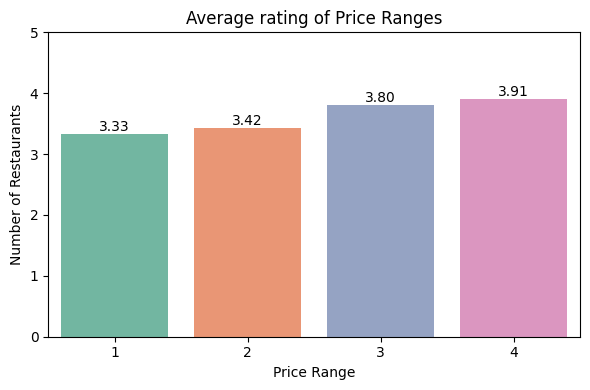

In [296]:
ratingbypricerange = df.groupby('Price range')['Aggregate rating'].mean().reset_index()
plt.figure(figsize=(6,4))
bar = sns.barplot(x = ratingbypricerange['Price range'], y = ratingbypricerange['Aggregate rating'], palette='Set2')
plt.ylim(0,5)
plt.title('Average rating of Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
for i in bar.containers:
    bar.bar_label(i, fmt='%.2f')
plt.tight_layout()
plt.show()

Insight:
- Higher price ranges tend to have slightly higher ratings, but there's not always a direct correlation.
- This indicates value for money and expectations play a role in customer ratings.

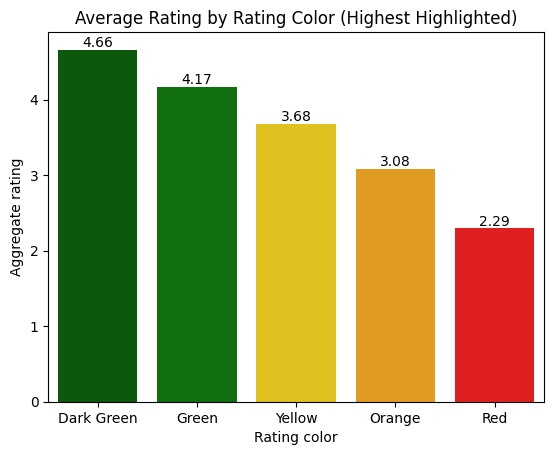

In [297]:
dta=df.groupby('Rating color')['Aggregate rating'].mean().sort_values(ascending=False).to_frame()
paltt={'Dark Green': '#006400', 'Green': '#008000', 'Yellow': '#FFD700', 'Orange': '#FFA500', 'Red': "#FF0000", 'White': "#FFFFFFFF"}
bar=sns.barplot(data=dta, x=dta.index, y='Aggregate rating',palette=paltt)
for i in bar.containers:
    bar.bar_label(i, fmt='%.2f')
plt.title('Average Rating by Rating Color (Highest Highlighted)')
plt.show()

Insight:
- Dark Green and Green indicate highest-rated experiences, as expected.
- These colors help customers identify highly rated restaurants at a glance.

In [298]:
df['Restaurant Name len'] = df['Restaurant Name'].apply(len)
df['Address len'] = df['Address'].apply(lambda x: len(x.split(',')))

In [299]:
df['Has Online delivery'] = df['Has Online delivery'].map({'No':0, 'Yes':1})
df['Has Table booking'] = df['Has Table booking'].map({'No':0, 'Yes':1})
df['Is delivering now'] = df['Is delivering now'].map({'No':0, 'Yes':1})

In [300]:
df.drop(columns=['Cuisines', 'Locality', 'Country', 'Currency', 'Rating color', 'Rating text', 'Restaurant ID', 'Restaurant Name', 'City', 'Address', 'Locality Verbose','Switch to order menu','Primary_Cuisine'], inplace=True)

Action Taken:
- Unnecessary ID or textual columns (Restaurant ID, Restaurant Name, Address, etc.)
- Redundant info like Rating text, Rating color, Currency, Country, etc.

In [301]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6169 entries, 0 to 6168
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Country Code          6169 non-null   int64  
 1   Longitude             6169 non-null   float64
 2   Latitude              6169 non-null   float64
 3   Average Cost for two  6169 non-null   int64  
 4   Has Table booking     6169 non-null   int64  
 5   Has Online delivery   6169 non-null   int64  
 6   Is delivering now     6169 non-null   int64  
 7   Price range           6169 non-null   int64  
 8   Aggregate rating      6169 non-null   float64
 9   Votes                 6169 non-null   int64  
 10  Restaurant Name len   6169 non-null   int64  
 11  Address len           6169 non-null   int64  
dtypes: float64(3), int64(9)
memory usage: 578.5 KB


In [302]:
df.to_csv('../data/cleaned.csv',index=False)